
# [Image Mining 2020] Lab 1 ‒ Feature Detection, Description and Matching

**Author:** Imad Eddine **MAROUF**         
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;*Email:* imad.marouf97@gmail.com

**Author:** Lukas **MALIK**                
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;*Email:* lukas.malik@web.de

**Due date:** 08.10.2020

---------------------------------------------------------------------------------------------------

In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import cv2

## Part I:  Image Format and Convolutions

> **Question 1**: the convolution code given as example in Convolutions.py. Note the difference
between the direct calculation by scanning the 2d array and the calculation using function filter2d
from OpenCV. 
- Try to decrypt the OpenCV functions used for image reading and copying, and the MatPlotLib function used for image display.
- Why the convolution kernel provided as example realises a contrast enhacement with respect to the original image ?

In [3]:
#Read grayscale image and conversion to float64
img = np.float64(cv2.imread('.\TP1_Image_Pairs\Image_Pairs\FlowerGarden2.png',0))
(h,w) = img.shape
print("Image dimension:", h,"rows x", w,"columns")

Image dimension: 240 rows x 360 columns


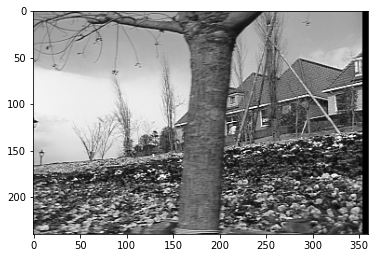

In [4]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.imshow(img, cmap='gray')

In [7]:
#Direct method
t1 = cv2.getTickCount()            #Function used to calculate the time used in order to execute the code
img2 = cv2.copyMakeBorder(img,0,0,0,0,cv2.BORDER_REPLICATE)

for y in range(1,h-1):
  for x in range(1,w-1):
    val = 5 * img[y, x] - img[y-1, x] - img[y, x-1] - img[y+1, x] - img[y, x+1] 
    img2[y,x] = min(max(val,0),255)
t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Direct method:", time,"s")

	 Direct method: 0.9648353 s


Text(0.5, 1.0, 'Convolution - Direct method')

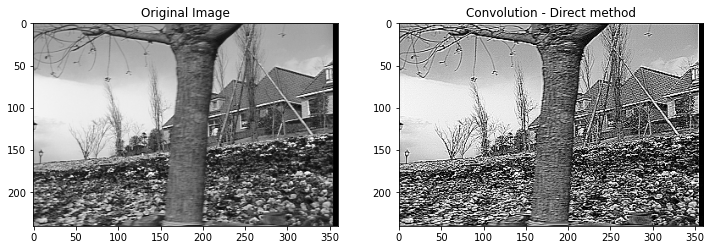

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(12, 7))
ax[0].imshow(img, cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(img2, cmap='gray')
ax[1].set_title('Convolution - Direct method')

**Comment:**
> - Direct convoltion kernel has enhanced the contrast of the image, but it is very slow regarding that it is small image but takes about 1s, it would be better if we apply factorization to improve execution performance.

------------------------------------------------------------------------------

In [9]:
#Method filter2D
t1 = cv2.getTickCount()
kernel = np.array([[0, -1, 0],[-1, 5, -1],[0, -1, 0]])
img3 = cv2.filter2D(img,-1,kernel)
t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Method filter2D :", time,"s")

	 Method filter2D : 0.0058461 s


Text(0.5, 1.0, 'Convolution - - filter2D')

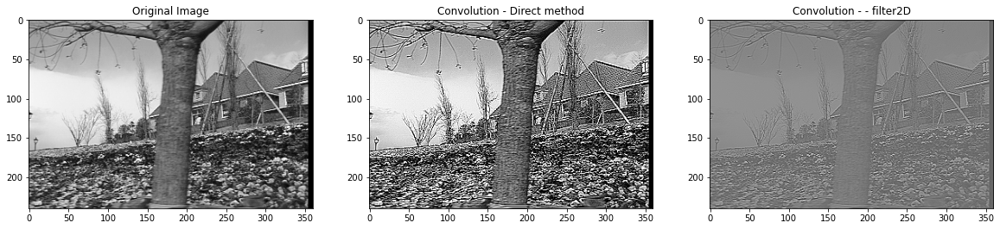

In [10]:
fig, ax = plt.subplots(1, 3, figsize=(20, 12))
ax[0].imshow(img, cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(img2, cmap='gray')
ax[1].set_title('Convolution - Direct method')

ax[2].imshow(img3, cmap='gray')
ax[2].set_title('Convolution - - filter2D')

In [11]:
pixel_max1 = np.max(img)
pixel_min1 = np.min(img)

pixel_max2 = np.max(img2)
pixel_min2 = np.min(img2)

pixel_max3 = np.max(img3)
pixel_min3 = np.min(img3)

In [12]:
print("\t Image1: Min: {}, Max: {}".format(pixel_min1, pixel_max1))
print("\t Image2: Min: {}, Max: {}".format(pixel_min2, pixel_max2))
print("\t Image3: Min: {}, Max: {}".format(pixel_min3, pixel_max3))

	 Image1: Min: 0.0, Max: 255.0
	 Image2: Min: 0.0, Max: 255.0
	 Image3: Min: -609.0, Max: 877.0


**Comment:**
- Fast convolution is much more faster by magnitude of 200X, since OpenCV uses advanced methods for matrix multiplication to improve execution performance.
- After applying the fast convolution method we can see clearly that the intesity of each pixel exceeds the expected value for RGB which is [0, 255]. Thus, we have to do mapping for intensity value for each pixel.

Text(0.5, 1.0, 'Convolution - - filter2D {After cropping intensity}')

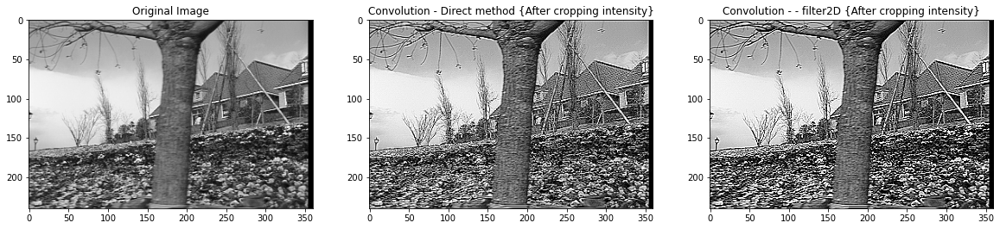

In [13]:
fig, ax = plt.subplots(1, 3, figsize=(20, 12))
ax[0].imshow(img, cmap='gray', vmin = 0.0, vmax = 255.0)
ax[0].set_title('Original Image')

ax[1].imshow(img2, cmap='gray', vmin = 0.0, vmax = 255.0)
ax[1].set_title('Convolution - Direct method {After cropping intensity}')

ax[2].imshow(img3, cmap='gray', vmin = 0.0, vmax = 255.0)
ax[2].set_title('Convolution - - filter2D {After cropping intensity}')

> **Explain:** Why the convolution kernel provided as example realises a contrast enhacement with
respect to the original image ?

> We know that an approximation of the second partial derivative with respect to x is given by: 

$$ {\frac{\partial I}{\partial x²}}  = \begin{bmatrix}0 & 0 & 0\\
1 & -2 & 1\\
0 & 0 & 0
\end{bmatrix}$$

Furthermore we know that the second partial derivative of y is given by the transpose: 

$$ {\frac{\partial I}{\partial y²}}  =  {\frac{\partial I}{\partial x²}}.T $$ 

$$
{\frac{\partial I}{\partial y²}}  =  \begin{bmatrix}0 & 1 & 0\\
0 & -2 & 0\\
0 & 1 & 0
\end{bmatrix}$$

Our original Image is given by the kernel: 

$$ {O} = \begin{bmatrix}0 & 0 & 0\\
0 & 1 & 0\\
0 & 0 & 0
\end{bmatrix}$$

Our local enhancement Kernel is therefore a result of the subtraction of the second partial derivatives: 

$$ \begin{bmatrix}0 & -1 & 0\\ -1 & 5 & -1\\ 0 & -1 & 0 \end{bmatrix}
 = O - ({\frac{\partial I}{\partial x²}} + {\frac{\partial I}{\partial y²}}) =
 \begin{bmatrix}0 & 0 & 0\\
0 & 1 & 0\\
0 & 0 & 0
\end{bmatrix} - \begin{bmatrix}0 & 1 & 0\\
1 & -4 & 1\\
0 & 1 & 0
\end{bmatrix} $$ 

> **Question 2**: Modify the code to compute, with the two methods, a convolution that approximates the partial
derivative Iy, then use a (fast) method to compute a box sum image.

In [14]:
# partial derivate with respect to x 
kernelx = np.array([[1, -1]])
kernely = np.array([[1, -1]]).T

In [17]:
#Direct method
t1 = cv2.getTickCount()
img4 = cv2.copyMakeBorder(img,0,0,0,0,cv2.BORDER_REPLICATE)
for y in range(1,h-1):
  for x in range(1,w-1):
    val = img[y, x] - img[y-1, x] 
    img4[y,x] = min(max(val,0),255)
t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Direct method:", time, "s")

	 Direct method: 0.5309613 s


In [18]:
#Method filter2D
t1 = cv2.getTickCount()
img5 = cv2.filter2D(img,- 1,kernely)
t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Method filter2D :", time,"s")

	 Method filter2D : 0.0010816 s


Text(0.5, 1.0, 'Convolution - - filter2D')

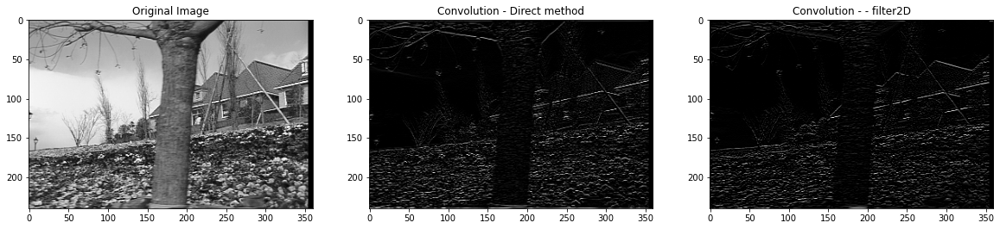

In [19]:
fig, ax = plt.subplots(1, 3, figsize=(20, 12))
ax[0].imshow(img, cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(img4, cmap='gray')
ax[1].set_title('Convolution - Direct method')

#We have to apply pixel intensity mapping as well here !
ax[2].imshow(img5, cmap='gray', vmin = 0.0, vmax = 255.0)
ax[2].set_title('Convolution - - filter2D')

In [20]:
# box sum -- fast method 
def box_sum(img, p): 
    #Create a square kernerl of ones
    kernel = np.ones((p, p))
    
    return cv2.filter2D(img,- 1, kernel)

In [21]:
new_image1 = box_sum(img, 2)
new_image2 = box_sum(img, 6)

Text(0.5, 1.0, 'Applying Sum Box - Size: 6')

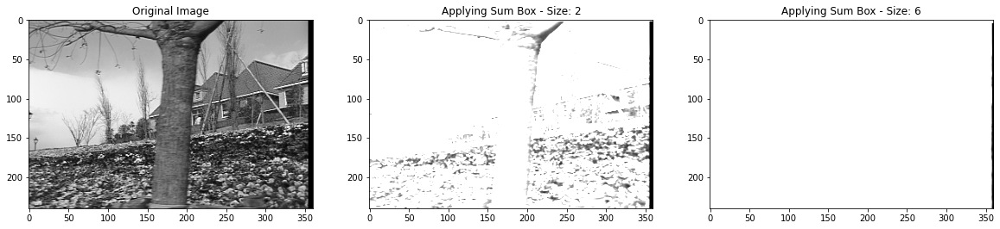

In [22]:
fig, ax = plt.subplots(1, 3, figsize=(20, 12))
ax[0].imshow(img, cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(new_image1, cmap='gray', vmin = 0.0, vmax = 255.0)
ax[1].set_title('Applying Sum Box - Size: 2')

ax[2].imshow(new_image2, cmap='gray', vmin = 0.0, vmax = 255.0)
ax[2].set_title('Applying Sum Box - Size: 6')

**Comment:**
- We observe that the resulting images are very bright, Let's display the histogram of the resulting images in order to see the distribution of pixels intensity

Text(0, 0.5, 'Number of pixels')

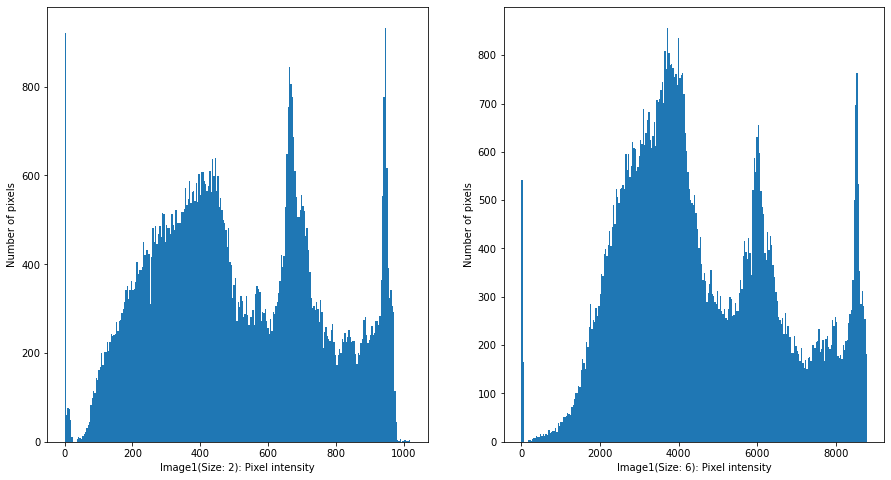

In [23]:
# Let's display the histogram of the resulting images in order to see the distribution of pixels intensity
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

ax[0].hist(new_image1.ravel(), bins = 256)
ax[0].set_xlabel('Image1(Size: 2): Pixel intensity')
ax[0].set_ylabel('Number of pixels')

ax[1].hist(new_image2.ravel(), bins = 256)
ax[1].set_xlabel('Image1(Size: 6): Pixel intensity')
ax[1].set_ylabel('Number of pixels')


In [24]:
pixel_max1 = np.max(new_image1)
pixel_min1 = np.min(new_image1)

pixel_max2 = np.max(new_image2)
pixel_min2 = np.min(new_image2)

print("\t Image1: Min: {}, Max: {}".format(pixel_min1, pixel_max1))
print("\t Image2: Min: {}, Max: {}".format(pixel_min2, pixel_max2))

	 Image1: Min: 0.0, Max: 1020.0
	 Image2: Min: 0.0, Max: 8783.0


**Comment:** 
- It seems that mapping pixels intensity of resulting image to the range [0, 255]. Does not provide very illustrative images, most of pixels intensity in picture 2 are above 1500 which reflects the fact that they are all displayed as white pixels.

- Therefore, we have to map function to the max, min values of the given image in order to get more homogenous contrast in the images.

Text(0.5, 1.0, 'Applying Sum Box - Size: 6')

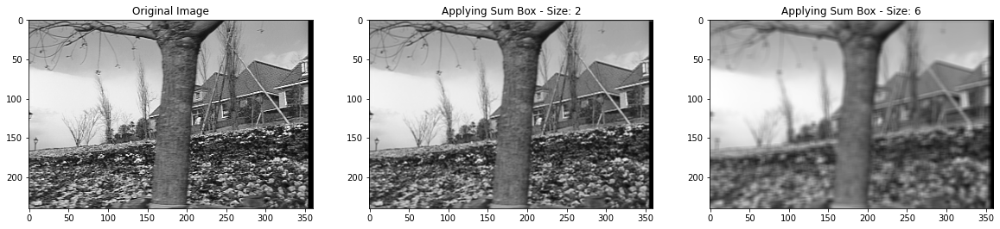

In [25]:
fig, ax = plt.subplots(1, 3, figsize=(20, 12))
ax[0].imshow(img, cmap='gray')
ax[0].set_title('Original Image')

ax[1].imshow(new_image1, cmap='gray', vmin = pixel_min1, vmax = pixel_max1)
ax[1].set_title('Applying Sum Box - Size: 2')

ax[2].imshow(new_image2, cmap='gray', vmin = pixel_min2, vmax = pixel_max2)
ax[2].set_title('Applying Sum Box - Size: 6')

In [26]:
#Experimenting with other images

img_test1 = np.float64(cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Cat2Fly0.png', 0))
img_test2 = np.float64(cv2.imread('.\TP1_Image_Pairs\Image_Pairs\CamSeq0.png', 0))
img_test3 = np.float64(cv2.imread('.\TP1_Image_Pairs\Image_Pairs\JBQ1.png', 0))
imgs = [img_test1, img_test2, img_test3]

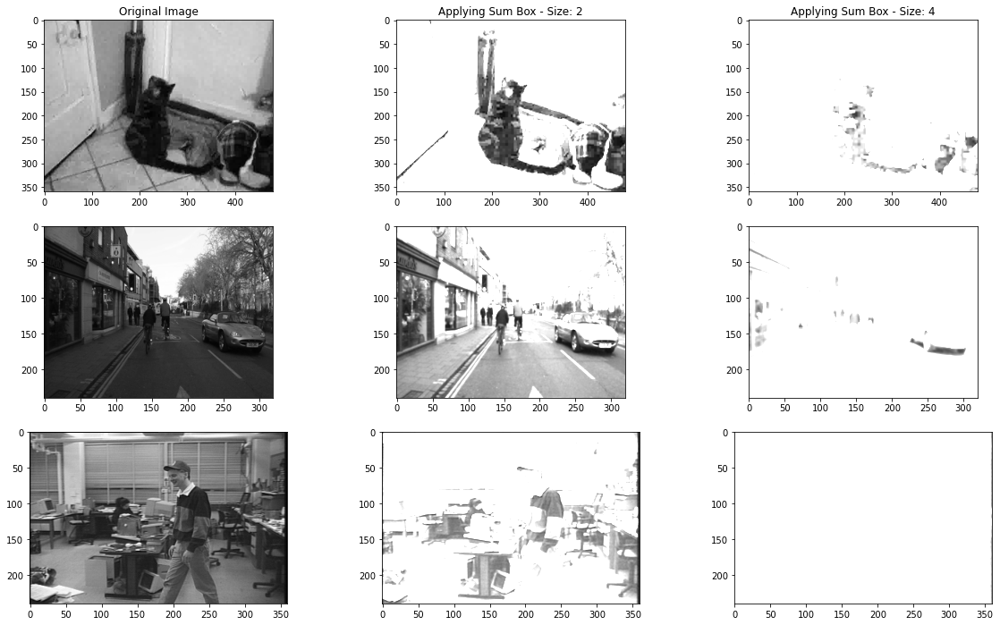

In [27]:
fig, ax = plt.subplots(3, 3, figsize=(20, 12))

for i in range(3):
    ax[i][0].imshow(imgs[i], cmap='gray')
    ax[0][0].set_title('Original Image')

    ax[i][1].imshow(box_sum(imgs[i], 2), cmap='gray', vmin = np.min(imgs[i]), vmax = np.max(imgs[i]))
    ax[0][1].set_title('Applying Sum Box - Size: 2')

    ax[i][2].imshow(box_sum(imgs[i], 4), cmap='gray', vmin = np.min(imgs[i]), vmax = np.max(imgs[i]))
    ax[0][2].set_title('Applying Sum Box - Size: 4')

> **Comment:**
>- As show above, after applying the sum_box filter, it does enhance the contrast of the image but sometimes it is really hard to keep the image really representative even after editing pixels intensity levels.
>> Precautions:
 - Both the minimum value _vmin_ and the maximum value _vmax_ are important for a proper display. 
 - The Box sum increases the pixel values in the image, therefore the new values are no longer between 0 and 255.
 - The Box sum kernel acts like a blur filter if _vmin_ is set to 0. 
 - The Box sum kernel brighten and blurs the image if _vmin_ is set to the minimum pixel value of the image.  


-------------------------------------------------------------------------------------------

## Part II: Detectors

> **Question 3**: Complete the code in the Harris.py script to compute the interest function of Harris (at one
single scale), and the corresponding interest points. 
- Can you understand how the suppression of non local maxima works in the provided code?
- Comment the results obtained with your Harris detector and the effect of the used parameters, in particular the size of the summing window and the value of α. How is it possible to extend this computation on several scales?

In [28]:
#Reading grayscale image and conversion to float64
img = np.float64(cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png',cv2.IMREAD_GRAYSCALE))
(h,w) = img.shape

In [30]:
print("\t Dimension of image:",h,"rows x",w,"columns")
print("\t Type of image:",img.dtype)

	 Dimension of image: 320 rows x 400 columns
	 Type of image: float64


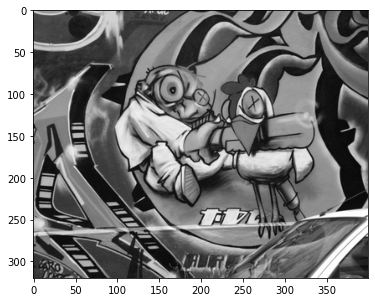

In [31]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.imshow(img, cmap='gray')

<ins> Sobel Operator: </ins>
> - The Sobel Operator is a discrete differentiation operator. It computes an approximation of the gradient of an image intensity function.
> - The Sobel Operator combines Gaussian smoothing and differentiation.

In [32]:
from scipy import signal as sig
import scipy

#Using the Sobel filter to find the derivatives. 
def gradient_x(imggray):
    ##Sobel operator kernels.
    kernel_x = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]])
    return sig.convolve2d(imggray, kernel_x, mode='same')

def gradient_y(imggray):
    kernel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    return sig.convolve2d(imggray, kernel_y, mode='same')

In [33]:
def harris_operation(img, k = 0.06):
    #Calculating derivatives
    I_x = gradient_x(img)
    I_y = gradient_y(img)

    Ixx = scipy.ndimage.gaussian_filter(I_x**2, sigma=1)
    Ixy = scipy.ndimage.gaussian_filter(I_y*I_x, sigma=1)
    Iyy = scipy.ndimage.gaussian_filter(I_y**2, sigma=1)

    #Dimension of image: 320 rows x 400 columns
    newImg = np.float32(img.copy())
    color_img = cv2.cvtColor(newImg, cv2.COLOR_GRAY2RGB)
    
    Sumxx = scipy.ndimage.gaussian_filter(Ixx, sigma=1)
    Sumxy = scipy.ndimage.gaussian_filter(Ixy, sigma=1)
    Sumyy = scipy.ndimage.gaussian_filter(Iyy, sigma=1)

    #Find determinant and trace, use to get corner response
    det = (Sumxx * Sumyy) - (Sumxy**2)
    trace = Sumxx + Sumyy
    Theta = det - k*(trace**2)
    return Theta

In [34]:
#Beginning of calculus
t1 = cv2.getTickCount()
Theta = cv2.copyMakeBorder(img, 0, 0, 0, 0, cv2.BORDER_REPLICATE)
# Put here Harris interest function calculation

Theta = harris_operation(Theta)
print("\t Share of Harris Score:", Theta.shape)

# Computing local maxima and thresholding
Theta_maxloc = cv2.copyMakeBorder(Theta, 0, 0, 0, 0, cv2.BORDER_REPLICATE)
d_maxloc = 3
seuil_relatif = 0.01
se = np.ones((d_maxloc,d_maxloc),np.uint8)
Theta_dil = cv2.dilate(Theta, se)

#Suppression of non-local-maxima
Theta_maxloc[Theta < Theta_dil] = 0.0

#Values to small are also removed
Theta_maxloc[Theta < seuil_relatif*Theta.max()] = 0.0

t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t My computation of Harris points:", time,"s")
print("\t Number of cycles per pixel:", (t2 - t1)/(h*w), "cpp")

	 Share of Harris Score: (320, 400)
	 My computation of Harris points: 0.1287677 s
	 Number of cycles per pixel: 10.0599765625 cpp


Text(0.5, 1.0, 'Harris function')

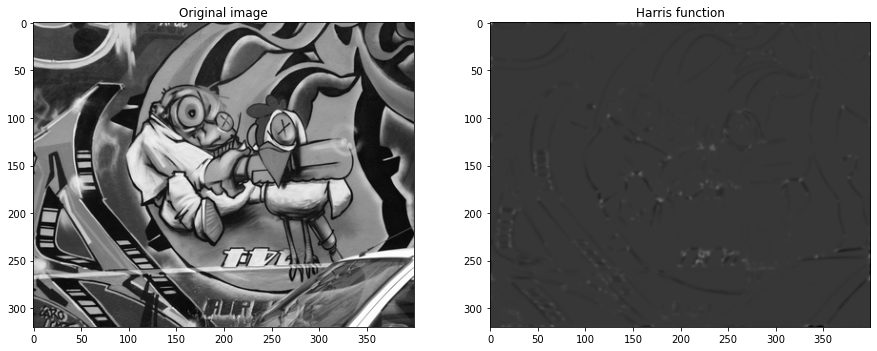

In [35]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(img,cmap = 'gray')
ax[0].set_title('Original image')

ax[1].imshow(Theta, cmap = 'gray')
ax[1].set_title('Harris function')

In [36]:
se_croix = np.uint8([[1, 0, 0, 0, 1],
[0, 1, 0, 1, 0],[0, 0, 1, 0, 0],
[0, 1, 0, 1, 0],[1, 0, 0, 0, 1]])
Theta_ml_dil = cv2.dilate(Theta_maxloc, se_croix)

#Re-read image for colour display
Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_COLOR)
(h,w,c) = Img_pts.shape
print("\t Dimension of image:", h,"rows x", w,"columns x", c,"channels")
print("\t Type of image:", Img_pts.dtype)

	 Dimension of image: 320 rows x 400 columns x 3 channels
	 Type of image: uint8


Text(0.5, 1.0, 'Harris points')

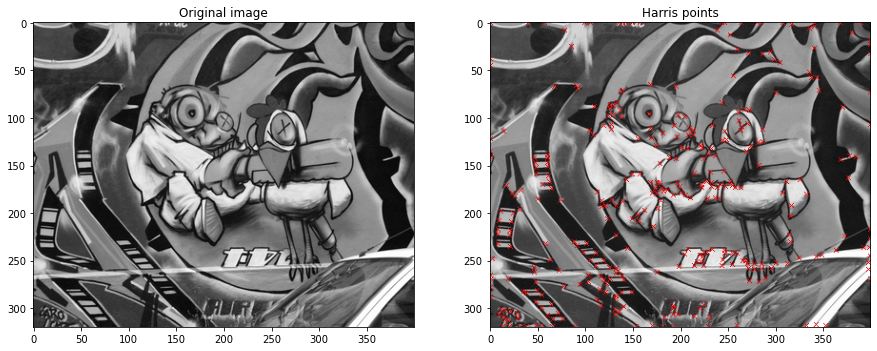

In [37]:
#Points are displayed as red crosses
Img_pts[Theta_ml_dil > 0] = [255,0,0]

fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(img,cmap = 'gray')
ax[0].set_title('Original image')

ax[1].imshow(Img_pts, cmap = 'gray')
ax[1].set_title('Harris points')

**Comment:**
> - Explain the suppression of non local maxima works in the provided code?
> > - The provided code snippet applies dilation process to the resulting image of Harris detector operation in order to to mark valid corners in the image, since dilation gives the value 1 to each pixel if the neighboring pixels are all set to 1.
> > - Afterwards, we select those points that are the maxima in their neighbourhood, we are suppressing the non local maxima points. In this process, we have to tune two free parameters: 

> > 1) _relative cornerness score α_: 
$$ α = {\frac{1}{threshold}} $$ 
> > 2) _the number of pixels_ to consider as those surrounding the interest points for non-max suppression. The advantage of using non-max suppression is that we don't have too many interest points in close proximity, thus avoiding the possibility of false matches.

In [38]:
def post_processing(Theta, seuil_relatif = 0.01):
    # Computing local maxima and thresholding
    Theta_maxloc = cv2.copyMakeBorder(Theta, 0, 0, 0, 0, cv2.BORDER_REPLICATE)
    d_maxloc = 3
    se = np.ones((d_maxloc,d_maxloc),np.uint8)
    Theta_dil = cv2.dilate(Theta, se)

    #Suppression of non-local-maxima
    Theta_maxloc[Theta < Theta_dil] = 0.0

    #Values to small are also removed
    Theta_maxloc[Theta < seuil_relatif*Theta.max()] = 0.0
    
    se_croix = np.uint8([[1, 0, 0, 0, 1],
    [0, 1, 0, 1, 0],[0, 0, 1, 0, 0],
    [0, 1, 0, 1, 0],[1, 0, 0, 0, 1]])
    Theta_ml_dil = cv2.dilate(Theta_maxloc, se_croix)
    
    return Theta_ml_dil

#### Effect of Sensitivity factor for Harris Detector:

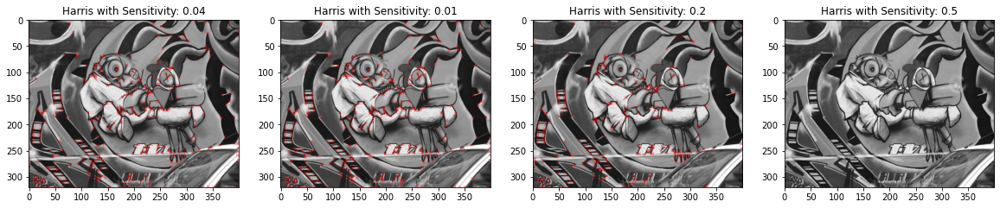

In [39]:
k_values = [0.04, 0.01, 0.2, 0.5]
img_copy = cv2.copyMakeBorder(img, 0, 0, 0, 0, cv2.BORDER_REPLICATE)

fig, ax = plt.subplots(1, 4, figsize=(20, 12))

for i, k in enumerate(k_values):
    Theta = harris_operation(img_copy, k)
    Theta_ml_dil = post_processing(Theta)
    Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_COLOR)
    
    Img_pts[Theta_ml_dil > 0] = [255,0,0]
    
    ax[i].imshow(Img_pts, cmap = 'gray')
    ax[i].set_title('Harris with Sensitivity: {}'.format(k))

#### Effect of Relative Threshold for Harris Detector:

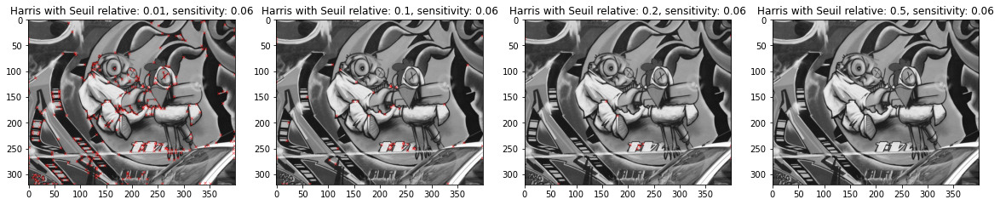

In [42]:
seuil_values = [0.01, 0.1, 0.2, 0.5]
img_copy = cv2.copyMakeBorder(img, 0, 0, 0, 0, cv2.BORDER_REPLICATE)

fig, ax = plt.subplots(1, 4, figsize=(20, 12))

for i, seuil in enumerate(seuil_values):
    Theta = harris_operation(img_copy, k = 0.06)
    Theta_ml_dil = post_processing(Theta, seuil)
    Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_COLOR)
    
    Img_pts[Theta_ml_dil > 0] = [255,0,0]
    
    ax[i].imshow(Img_pts, cmap = 'gray')
    ax[i].set_title('Harris with Seuil relative: {}, sensitivity: {}'.format(seuil, 0.06))

**Comment:**
> - The effect of the used parameters: 
> > - <ins> Threshold </ins> : lesser and lesser corner features are detected when the threshold is increased.
_As illustrated above, we get less corner points by increasing the relative threshold since it is relative to the maximum intensity pixel in the image._
> > - <ins> The value of α</ins>: α is the sensitivity factor to separate corners from edges, typically a value close to zero, for my analysis I have taken α=0.06. _Small values of α result in detection of sharp corners. 
As illustrated above increasing the sensitivy factor will reduce the corner points detected._

**Using OpenCV built-in function**

In [43]:
image = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_GRAYSCALE)
#img_copy = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
img_copy = np.float32(image)

#img_copy = np.stack((img_copy_for_corners,)*3, axis=-1)
dst = cv2.cornerHarris(img_copy, 5, 3, 0.06)

#result is dilated for marking the corners, not important
dst = cv2.dilate(dst,None)

Img_pts2 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png',cv2.IMREAD_COLOR)
# Threshold for an optimal value, it may vary depending on the image.
Img_pts2[dst>0.01*dst.max()] = [0, 255, 0]

Text(0.5, 1.0, 'Our Implementation')

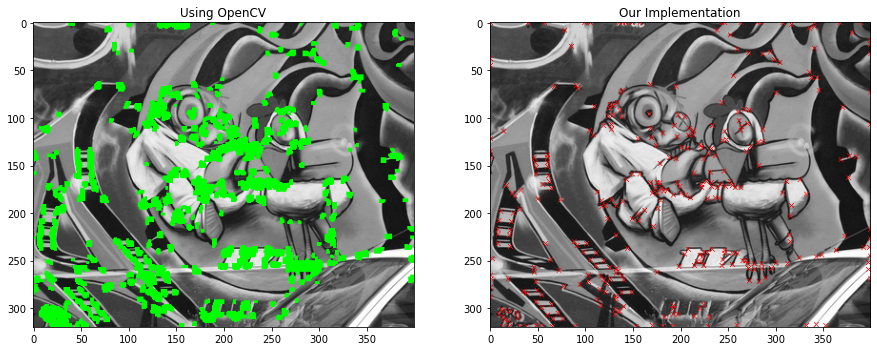

In [44]:
#Points are displayed as red crosses
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(Img_pts2, cmap = 'gray')
ax[0].set_title('Using OpenCV')

Theta = harris_operation(img_copy, k = 0.06)
Theta_ml_dil = post_processing(Theta, 0.01)
Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_COLOR)
Img_pts[Theta_ml_dil > 0] = [255,0,0]

ax[1].imshow(Img_pts, cmap = 'gray')
ax[1].set_title('Our Implementation')

**Experimenting Harris detector with different scales:**

In [45]:
#Function to rescale images in order to check the performance of harris detecor

def rescaling(img, scale_percent = 60): 
    width = int(img.shape[1] * scale_percent / 100)
    height = int(img.shape[0] * scale_percent / 100)
    dim = (width, height)
    # resize image
    resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
    return resized

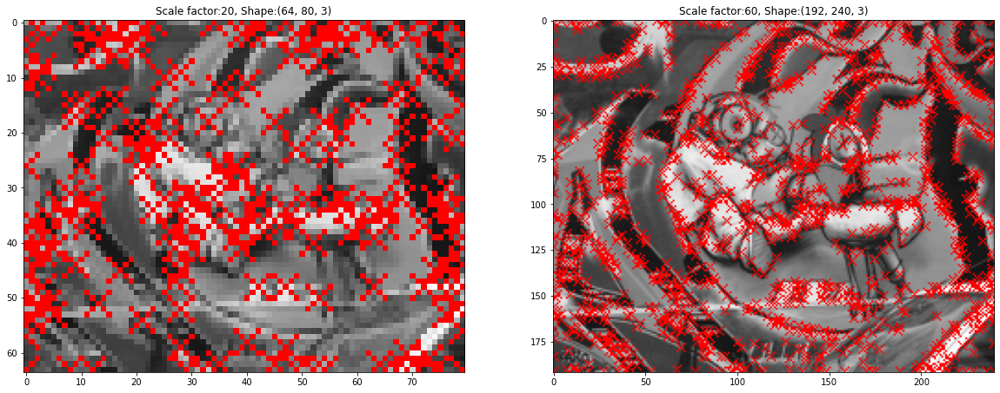

In [46]:
scale_values1 = [20, 60]

img_copy = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_UNCHANGED)
#img_copy = cv2.copyMakeBorder(img, 0, 0, 0, 0, cv2.BORDER_REPLICATE)

fig, ax = plt.subplots(1, 2, figsize=(20, 12))

for i, k in enumerate(scale_values1):
    resized_img = rescaling(img_copy, k)
    Theta = harris_operation(resized_img)
    
    Theta_ml_dil = post_processing(Theta)
    Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_COLOR)
    Img_pts = rescaling(Img_pts, k)
    Img_pts[Theta_ml_dil > 0] = [255,0,0]
    
    ax[i].imshow(Img_pts, cmap = 'gray')
    ax[i].set_title('Scale factor:{}, Shape:{}'.format(k, Img_pts.shape))

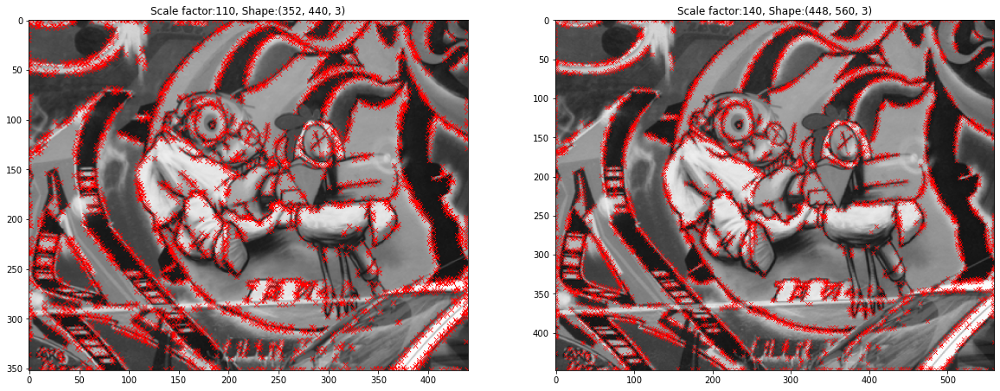

In [47]:
scale_values2 = [110, 140]

img_copy = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_UNCHANGED)
#img_copy = cv2.copyMakeBorder(img, 0, 0, 0, 0, cv2.BORDER_REPLICATE)

fig, ax = plt.subplots(1, 2, figsize=(20, 12))

for i, k in enumerate(scale_values2):
    resized_img = rescaling(img_copy, k)
    Theta = harris_operation(resized_img)
    
    Theta_ml_dil = post_processing(Theta)
    Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_COLOR)
    Img_pts = rescaling(Img_pts, k)
    Img_pts[Theta_ml_dil > 0] = [255,0,0]
    
    ax[i].imshow(Img_pts, cmap = 'gray')
    ax[i].set_title('Scale factor:{}, Shape:{}'.format(k, Img_pts.shape))

> **Comment:**
> - How is it possible to extend this computation on several scales?
>> _As illustrated above the traditional method of Harris detector is not robust to different scales of the same image, which makes it very difficult to use resulting corner points as features for matching._

>> - Yes, we can use what is called "Scale Adapted Harris Detector", we extract feature points for range of scales, and then we evaluate the feature points for each scale. Rather than using 1st derivatives we privilege Laplace Of Gaussian (since zero-crossing of 2nd derivative is much more effecient and use of second order derivative insures a
maxima for a localized neighborhood).

> Quoted from Thesis: "http://perception.inrialpes.fr/Publications/2002/Mik02/Mikolajczyk_these2002.pdf"

    In our experiments (cf. section 3.2.4) we noticed that the scale adapted Harris function rarely attains maxima over scales in a scale-space representation. If too few interest points are detected, the image is not reliably represented. Therefore, we abandoned the idea of searching 3D maxima of the Harris function. Furthermore, the experiments showed that LoG function enables the highest percentage of correct characteristic scales to be found. Therefore, we propose to use the Laplacian to select the scales for points extracted with the Harris detector. Harris-Laplace detector uses the Harris function (cf. equation 4.1) to localize points in each level of the scale-space representation. Next, it selects the points, for which the Laplacian-of-Gaussian (cf. equation 4.2) attains a maximum over scale. In this way we combine these two methods to obtain a reliable interest point detector invariant to signicant scale changes.
    
>> - At each scale, find Harris points having a maxima. On each point, we use LoG measure to see if it is a local maxima greater than a threshold.


#### Rotation invariance for Harris Detector:

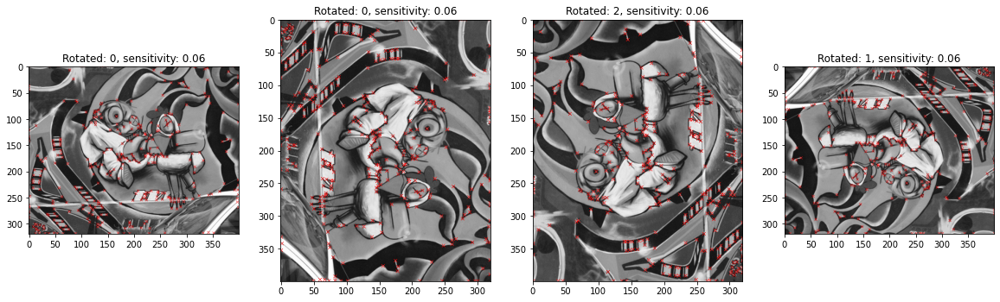

In [61]:
rotation_values = [0, cv2.ROTATE_90_CLOCKWISE, cv2.ROTATE_90_COUNTERCLOCKWISE, cv2.ROTATE_180]
img_copy = cv2.copyMakeBorder(img, 0, 0, 0, 0, cv2.BORDER_REPLICATE)

fig, ax = plt.subplots(1, 4, figsize=(20, 12))

for i, value in enumerate(rotation_values):
    #Argument for rotate method should be enum
    if i == 0:
        image_rotated = img_copy
    else:
        image_rotated = cv2.rotate(img_copy, value) 
    
    Theta = harris_operation(image_rotated, k = 0.06)
    Theta_ml_dil = post_processing(Theta)
    
    Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Graffiti0.png', cv2.IMREAD_COLOR)
    
    if i == 0:
        Img_pts_rotated = Img_pts
    else:
        Img_pts_rotated = cv2.rotate(Img_pts, value)
    
    Img_pts_rotated[Theta_ml_dil > 0] = [255,0,0]
    
    ax[i].imshow(Img_pts_rotated, cmap = 'gray')
    ax[i].set_title('Rotated: {}, sensitivity: {}'.format(value, 0.06))

> **Comment:**
>> - _As illustrated above, the Harris corner response is invariant to image rotation._

**Experimenting with different images:**

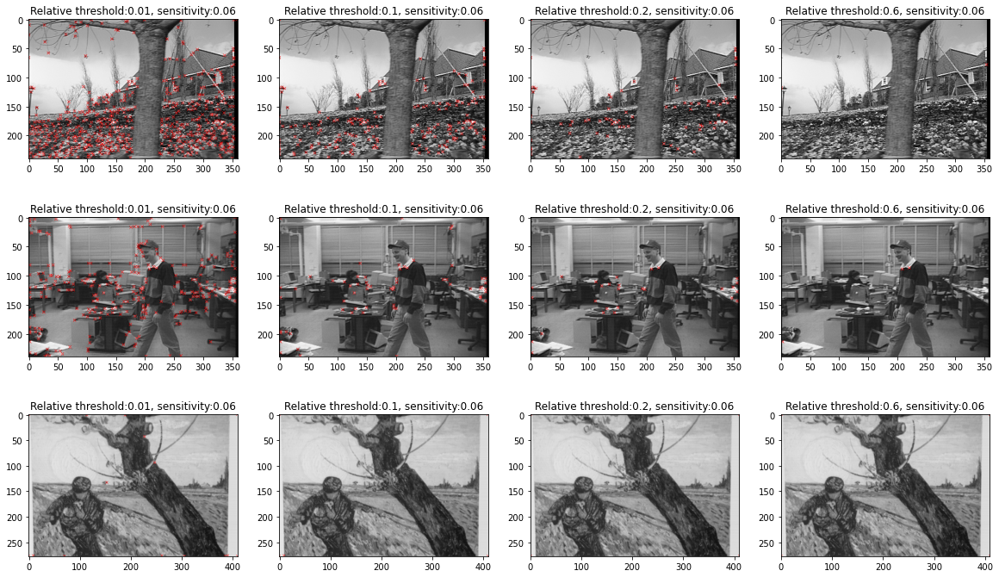

In [62]:
seuil_values = [0.01, 0.1, 0.2, 0.6]

fig, ax = plt.subplots(3, 4, figsize=(20, 12))
for j in range(3):
    for i, seuil in enumerate(seuil_values):
        # I have to do condition inside the loop since the mask generated on Img_pts is in-place assignment, therefore we need 
        # each time to override the previous value of Img_pts variable
        if j == 0:
            img_gray = np.float64(cv2.imread('.\TP1_Image_Pairs\Image_Pairs\FlowerGarden1.png',cv2.IMREAD_GRAYSCALE))
            Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\FlowerGarden1.png', cv2.IMREAD_COLOR)
        elif j == 1:
            img_gray = np.float64(cv2.imread('.\TP1_Image_Pairs\Image_Pairs\JBQ0.png',cv2.IMREAD_GRAYSCALE))
            Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\JBQ0.png', cv2.IMREAD_COLOR)
        else:
            img_gray = np.float64(cv2.imread('.\TP1_Image_Pairs\Image_Pairs\VanGogh0.png',cv2.IMREAD_GRAYSCALE))
            Img_pts = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\VanGogh0.png', cv2.IMREAD_COLOR)
        Theta = harris_operation(img_gray, k = 0.06)
        Theta_ml_dil = post_processing(Theta, seuil)

        Img_pts[Theta_ml_dil > 0] = [255,0,0]

        ax[j][i].imshow(Img_pts, cmap = 'gray')
        ax[j][i].set_title('Relative threshold:{}, sensitivity:{}'.format(seuil, 0.06))

> **Comment:**
>> - _As illustrated in in the previous examples, harris detector is very senstive to the threshold value, it cannot be the same for various images, since it depends on the contrast and noise for each image._

**References:**
> - https://core.ac.uk/download/pdf/25740537.pdf
> - https://en.wikipedia.org/wiki/Harris_affine_region_detector#Gaussian_scale-space
> - https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_features_harris/py_features_harris.html
> - https://sandipanweb.wordpress.com/2017/10/22/feature-detection-with-harris-corner-detector-and-matching-images-with-feature-descriptors-in-python/

--------------------------------------------------------------------------------------------

> **Question 4**: Experiment and compare the two detectors ORB and KAZE by running the script Features Detect.py.
- Recall the principles of each detector, and play with their major parameters. 
- How is it possible to visually evaluate the repeatability of each detector applied on a pair of images?

In [88]:
#Read the image pair
img1 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\hello1.png')
print("\t Dimension of image 1:", img1.shape[0], "rows x", img1.shape[1], "columns")
print("\t Type of image 1:", img1.dtype)
img2 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\hello2.png')
print("\t Dimension of image 2:",img2.shape[0], "rows x", img2.shape[1], "columns")
print("\t Type of image 2:", img2.dtype)

	 Dimension of image 1: 418 rows x 402 columns
	 Type of image 1: uint8
	 Dimension of image 2: 418 rows x 402 columns
	 Type of image 2: uint8


In [89]:
# for "orb" detector = 1, kaze detector: 2
detector = 1

In [90]:
#Beginning the calculus...
def detector_choice(detector):
    #Creation of objects "keypoints"
    if detector == 1:
      kp1 = cv2.ORB_create(nfeatures = 250,#By default : 500
                           scaleFactor = 2,#By default : 1.2
                           nlevels = 3)#By default : 8
      kp2 = cv2.ORB_create(nfeatures=250,
                           scaleFactor = 2,
                           nlevels = 3)
      print("\t Detector: ORB")
    else:
      kp1 = cv2.KAZE_create(upright = False,#By default : false
                        threshold = 0.001,#By default : 0.001
                        nOctaves = 4,#By default : 4
                        nOctaveLayers = 4,#By default : 4
                        diffusivity = 2)#By default : 2
      kp2 = cv2.KAZE_create(upright = False,#By default : false
                    threshold = 0.001,#By default : 0.001
                    nOctaves = 4,#By default : 4
                    nOctaveLayers = 4,#By default : 4
                    diffusivity = 2)#By default : 2
      print("\t Detector: KAZE")
    return kp1, kp2

#### ORB Detector:
> - it is a good alternative to SIFT and SURF in computation cost, matching performance and mainly the patents.

In [91]:
#Conversion to grayscale
gray1 =  cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
gray2 =  cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

t1 = cv2.getTickCount()
kp1, kp2 = detector_choice(detector = 1)
#Keypoints detection
pts1 = kp1.detect(gray1,None)
nbr_pts1 = len(pts1)

pts2 = kp2.detect(gray2,None)
nbr_pts2 = len(pts2)
t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Detection of key points:",time,"s")

#Displaying the keypoints
img1 = cv2.drawKeypoints(gray1, pts1, None, flags=4)
# flags defines the information level on key points
# 0: position only; 4: position + scale + direction
img2 = cv2.drawKeypoints(gray2, pts2, None, flags=4)

	 Detector: ORB
	 Detection of key points: 0.0141538 s


Text(0.5, 1.0, 'Image n°2 with ORB, Nbr of KeyPoints: 250')

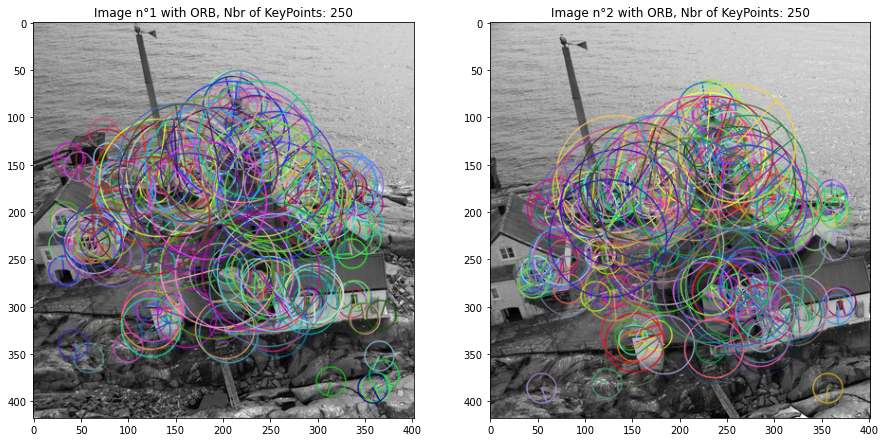

In [92]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(img1)
ax[0].set_title('Image n°1 with ORB, Nbr of KeyPoints: {}'.format(nbr_pts1))

ax[1].imshow(img2)
ax[1].set_title('Image n°2 with ORB, Nbr of KeyPoints: {}'.format(nbr_pts2))

#### KAZE Detector:
- KAZE makes use of nonlinear diffusion filtering alongside the AOS (Additive Operator Splitting) method. With this filtering the image noise is reduced but the object boundaries are kept.
- Since KAZE computes multi-scale derivatives (gradients) for each pixel it is more expensive to compute than SURF, though still comparable to SIFT

In [93]:
#Conversion to grayscale
gray1 =  cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
gray2 =  cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

t1 = cv2.getTickCount()
kp1, kp2 = detector_choice(detector = 2)

#Keypoints detection
pts1 = kp1.detect(gray1,None)
nbr_pts1 = len(pts1)

pts2 = kp2.detect(gray2,None)
nbr_pts2 = len(pts2)
t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Detection of key points:",time,"s")

#Displaying the keypoints
img1 = cv2.drawKeypoints(gray1, pts1, None, flags=4)
# flags defines the information level on key points
# 0: position only; 4: position + scale + direction
img2 = cv2.drawKeypoints(gray2, pts2, None, flags=4)

	 Detector: KAZE
	 Detection of key points: 1.1364519 s


Text(0.5, 1.0, 'Image n°2 with Kaze, Nbr of KeyPoints: 813')

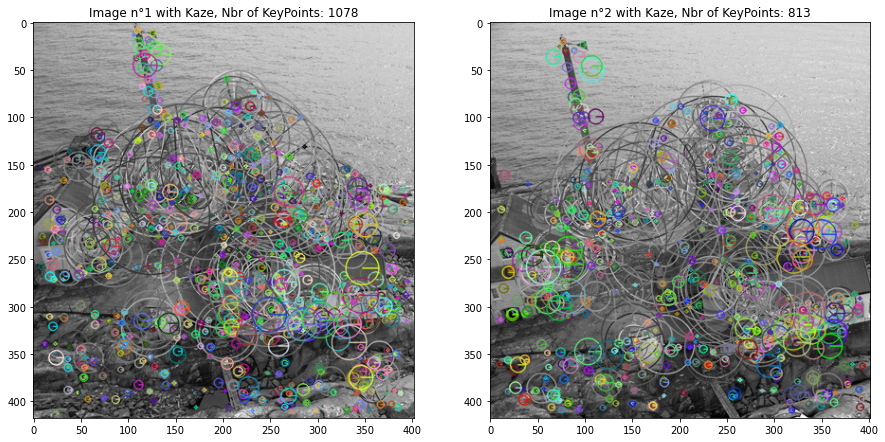

In [94]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))
ax[0].imshow(img1)
ax[0].set_title('Image n°1 with Kaze, Nbr of KeyPoints: {}'.format(nbr_pts1))

ax[1].imshow(img2)
ax[1].set_title('Image n°2 with Kaze, Nbr of KeyPoints: {}'.format(nbr_pts2))

**Comments:**
> - We have found that both decent number of keypoints in the pair image, which is good enough for similarity match.

#### Experimenting with others picture:

In [95]:
#Read the image pair
img3 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Cat2Fly0.png')
print("\t Dimension of image 1:", img1.shape[0], "rows x", img1.shape[1], "columns")
print("\t Type of image 1:", img1.dtype)
img4 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Cat2Fly1.png')
print("\t Dimension of image 2:",img2.shape[0], "rows x", img2.shape[1], "columns")
print("\t Type of image 2:", img2.dtype)

	 Dimension of image 1: 418 rows x 402 columns
	 Type of image 1: uint8
	 Dimension of image 2: 418 rows x 402 columns
	 Type of image 2: uint8


In [96]:
#ORB Detector
#Conversion to grayscale
gray1 =  cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
gray2 =  cv2.cvtColor(img4, cv2.COLOR_BGR2GRAY)

t1 = cv2.getTickCount()
kp1, kp2 = detector_choice(detector = 1)
#Keypoints detection
pts1 = kp1.detect(gray1,None)
pts2 = kp2.detect(gray2,None)
t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Detection of key points:",time,"s")

#Displaying the keypoints
img1 = cv2.drawKeypoints(gray1, pts1, None, flags=4)
# flags defines the information level on key points
# 0: position only; 4: position + scale + direction
img2 = cv2.drawKeypoints(gray2, pts2, None, flags=4)

#-------------------------
#KAZE Detector
#Conversion to grayscale
gray1 =  cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)
gray2 =  cv2.cvtColor(img4, cv2.COLOR_BGR2GRAY)

t1 = cv2.getTickCount()
kp1, kp2 = detector_choice(detector = 2)

#Keypoints detection
pts3 = kp1.detect(gray1, None)
pts4 = kp2.detect(gray2, None)
t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Detection of key points:",time,"s")

#Displaying the keypoints
img3 = cv2.drawKeypoints(gray1, pts1, None, flags=4)
# flags defines the information level on key points
# 0: position only; 4: position + scale + direction
img4 = cv2.drawKeypoints(gray2, pts2, None, flags=4)

	 Detector: ORB
	 Detection of key points: 0.0062249 s
	 Detector: KAZE
	 Detection of key points: 1.0964289 s


Text(0.5, 1.0, 'Image n°2 with Kaze, Nbr of KeyPoints: 110')

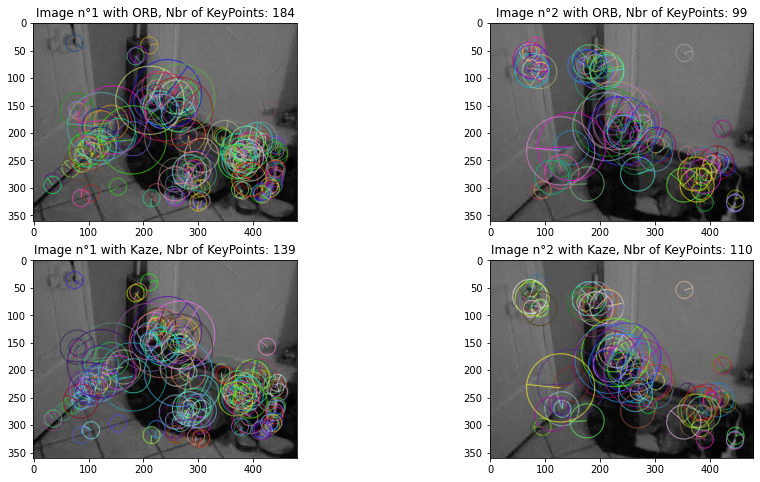

In [97]:
fig, ax = plt.subplots(2, 2, figsize=(15, 8))
ax[0][0].imshow(img1)
ax[0][0].set_title('Image n°1 with ORB, Nbr of KeyPoints: {}'.format(len(pts1)))

ax[0][1].imshow(img2)
ax[0][1].set_title('Image n°2 with ORB, Nbr of KeyPoints: {}'.format(len(pts2)))

ax[1][0].imshow(img3)
ax[1][0].set_title('Image n°1 with Kaze, Nbr of KeyPoints: {}'.format(len(pts3)))

ax[1][1].imshow(img4)
ax[1][1].set_title('Image n°2 with Kaze, Nbr of KeyPoints: {}'.format(len(pts4)))

In [106]:
#Read the image pair
img_3 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Mug_Antoine0.png')
img_4 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Mug_Antoine1.png')
img_5 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Mug_Antoine2.png')
img_6 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Mug_Antoine3.png')

#ORB Detector
#Conversion to grayscale
gray1 =  cv2.cvtColor(img_3, cv2.COLOR_BGR2GRAY)
gray2 =  cv2.cvtColor(img_4, cv2.COLOR_BGR2GRAY)
gray3 =  cv2.cvtColor(img_5, cv2.COLOR_BGR2GRAY)
gray4 =  cv2.cvtColor(img_6, cv2.COLOR_BGR2GRAY)

t1 = cv2.getTickCount()
kp1, kp2 = detector_choice(detector = 1)
kp3, kp4 = detector_choice(detector = 1)
#Keypoints detection
pts1 = kp1.detect(gray1,None)
pts2 = kp2.detect(gray2,None)
pts3 = kp3.detect(gray3,None)
pts4 = kp4.detect(gray4,None)

t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Detection of key points:",time,"s")

#Displaying the keypoints
img1 = cv2.drawKeypoints(gray1, pts1, None, flags=4)
img2 = cv2.drawKeypoints(gray2, pts2, None, flags=4)
img3 = cv2.drawKeypoints(gray3, pts3, None, flags=4)
img4 = cv2.drawKeypoints(gray4, pts4, None, flags=4)

#-------------------------
#KAZE Detector
t1 = cv2.getTickCount()
kp11, kp22 = detector_choice(detector = 2)
kp33, kp44 = detector_choice(detector = 2)
#Keypoints detection
pts11 = kp11.detect(gray1,None)
pts22 = kp22.detect(gray2,None)
pts33 = kp33.detect(gray3,None)
pts44 = kp44.detect(gray4,None)

t2 = cv2.getTickCount()
time = (t2 - t1)/ cv2.getTickFrequency()
print("\t Detection of key points:",time,"s")

#Displaying the keypoints
img11 = cv2.drawKeypoints(gray1, pts11, None, flags=4)
img22 = cv2.drawKeypoints(gray2, pts22, None, flags=4)
img33 = cv2.drawKeypoints(gray3, pts33, None, flags=4)
img44 = cv2.drawKeypoints(gray4, pts44, None, flags=4)


	 Detector: ORB
	 Detector: ORB
	 Detection of key points: 0.0078797 s
	 Detector: KAZE
	 Detector: KAZE
	 Detection of key points: 1.4589847 s


Text(0.5, 1.0, 'N°4 with Kaze, KeyPoints: 137')

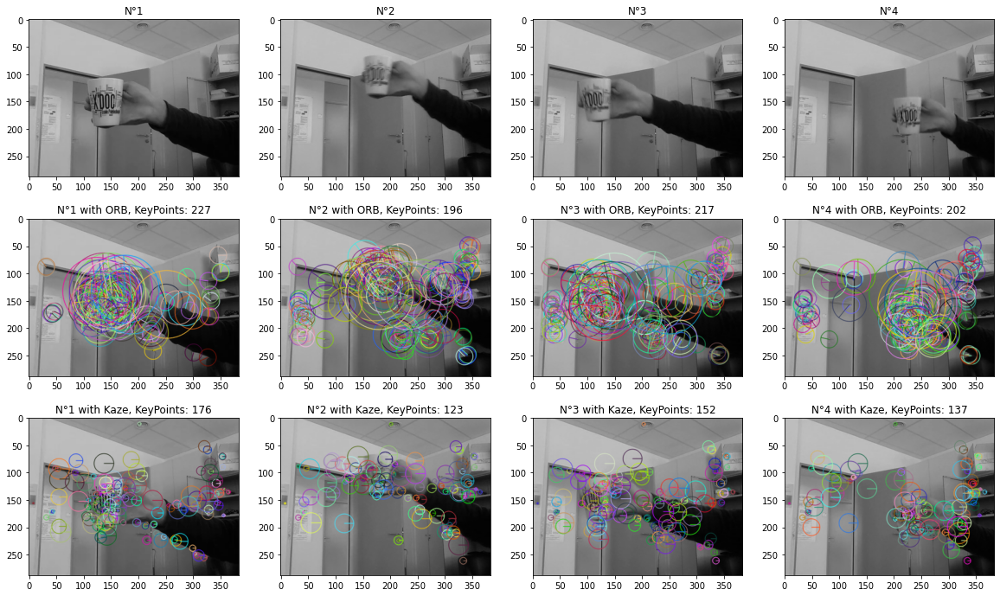

In [110]:
fig, ax = plt.subplots(3, 4, figsize=(20, 12))
ax[0][0].imshow(img_3)
ax[0][0].set_title('N°1')
ax[0][1].imshow(img_4)
ax[0][1].set_title('N°2')
ax[0][2].imshow(img_5)
ax[0][2].set_title('N°3')
ax[0][3].imshow(img_6)
ax[0][3].set_title('N°4')

ax[1][0].imshow(img1)
ax[1][0].set_title('N°1 with ORB, KeyPoints: {}'.format(len(pts1)))

ax[1][1].imshow(img2)
ax[1][1].set_title('N°2 with ORB, KeyPoints: {}'.format(len(pts2)))

ax[1][2].imshow(img3)
ax[1][2].set_title('N°3 with ORB, KeyPoints: {}'.format(len(pts3)))

ax[1][3].imshow(img4)
ax[1][3].set_title('N°4 with ORB, KeyPoints: {}'.format(len(pts4)))

ax[2][0].imshow(img11)
ax[2][0].set_title('N°1 with Kaze, KeyPoints: {}'.format(len(pts11)))

ax[2][1].imshow(img22)
ax[2][1].set_title('N°2 with Kaze, KeyPoints: {}'.format(len(pts22)))

ax[2][2].imshow(img33)
ax[2][2].set_title('N°3 with Kaze, KeyPoints: {}'.format(len(pts33)))

ax[2][3].imshow(img44)
ax[2][3].set_title('N°4 with Kaze, KeyPoints: {}'.format(len(pts44)))

**Comment:**
>  **How is it possible to visually evaluate the repeatability of each detector applied on a pair of images?**
>> - Repeatable = a point should appear at the very same place whatever the deformation.

>> - Idea: _Count the keypoints detected at image, and check if they are the same on the other one based on defined criterian._
>>> "Repeatability means that detection is independent of changes in the imaging conditions, i.e. the
parameters of the camera, its position relative to the scene, and the illumination conditions. 3D
points detected in one image should also be detected at approximately corresponding positions
in subsequent ones. Given a 3D point X and two projection matrices P1 and Pi, the projections of X into images I1 and Ii are x1 = P1X and xi = PiX. A point x1 detected in image I1 is repeated in image Ii if the corresponding point xi is detected in image Ii. To measure the repeatability, a unique relation between x1 and xi has to be established. This is difficult for
general 3D scenes, but in the case of a planar scene this relation is defined by a homography.
The repeatability rate is defined as the number of points repeated between two images with
respect to the total number of detected points."

                       **Reference:** https://hal.inria.fr/inria-00548302/document


---------------------------------------------------------------------

## Part 4: Description and Matching

> **Question 5**: 
>- **Find the principles of the descriptors attached to points ORB and those attached to points KAZE.**
>> - _ORB stands for Oriented FAST and Rotated BRIEF. ORB uses the Brief Descriptor for feature point descriptions. Brief uses a gaussian kernel to smooth the pixels in the neighborhood region of the interest points. It then creates a binary vector from these smoothed neighborhoods (patches). The feature vector is then defined by a binary test (Rublee, Rabaud, Konolige & Bradski, 2011)._

>- **What properties of detectors and/or descriptors (distinguish the two aspects in your answer), allow to make the matching scale and rotation invariant?**

>> 1\ **Detectors**:
>>> - **What makes the detector scale invariant?**
>>> * _The ORB detector achieves scale invariance using a "multiscale pyramid". It downsamples the image to different resolutions and detects keypoints for each resolution using a weighting function._
>>> * _The KAZE detector uses the original image to create a blurred image using nonlinear diffusion filtering. The nonlinear diffusion filtering retains the boundaries and is locally adaptive. This blur guarantees scale invariance as it respects the natural boundaries of the image. Keypoints are identified by using the response of scale-normalized determinant of the Hessian. The maximum response values are possible keypoints._ 
>>> - **What makes the detector rotation invariant?**
>>> * _After detecting the keypoints, ORB assigns a left or right facing orientation based on the change in intensity around the keypoint. Given this orientation we can rotate the patch to a canonical rotation._
_Regarding the KAZE detector, it uses an orientation assignment step, where the orientation is given by the local gradient for each keypoint. As a result the rotational invariance for each keypoint is preserved._

>> 2\ **Descriptors**:
>>> -  **What makes the descriptor scale invariant?** 
>>> * _BRIEF uses a gaussian kernel to smooth neighbourhood pixels. Scale invariance is therefore achieved in a similar way as with the KAZE detector._ 
>>> * _KAZE achieves scale invariance by weighting the derivative responses with a gaussian over a rectangular grid centered over the interest points (Alcantarilla, Bartoli & Davison, 2012)._

>>> - **What makes the descriptor rotation invariant?** 
>>> * _According to Rublee, Rabaud, Konolige and Bradski (2011) the BRIEF Descriptors is senstivie to in-plane rotation. This is fixed by using Steered BRIEF, which uses the orientation of the patch at the location of each binary test._ 
>>> * _KAZE achieves rotations invariance by rotating the description vector according to the dominant direction of each keypoint. The dominant direction is found by summing the first order derivative responses with a sliding circle segment (Alcantarilla, Bartoli & Davison, 2012)._



---------------------------------------------------------------------------------

> **Question 6**: 
>- Explain and compare qualitatively the effects of the three different point matching strategies performed in the three scripts Features Match CrossCheck.py, Features Match RatioTest.py and Features Match FLANN.py. 
>- Explain why the used distances are different for the two descriptors. 
>- Explain why the strategy FLANN (and, in a lesser extent the strategy RatioTest) does not work well with
ORB points. 

In [133]:
# fitting KAZE or ORB part 
def fit_detector(detector,img1,img2):
    #Beginning the calculus
    t1 = cv2.getTickCount()
    #Creation of objects "keypoints"
    if detector == 1:
      kp1 = cv2.ORB_create(nfeatures = 500,#By default : 500
                           scaleFactor = 1.2,#By default : 1.2
                           nlevels = 8)#By default : 8
      kp2 = cv2.ORB_create(nfeatures=500,
                            scaleFactor = 1.2,
                            nlevels = 8)
      print("\t Detector: ORB")
    else:
      kp1 = cv2.KAZE_create(upright = False,#By default : false
                        threshold = 0.001,#By default : 0.001
                    nOctaves = 4,#By default : 4
                    nOctaveLayers = 4,#By default : 4
                    diffusivity = 2)#By default : 2
      kp2 = cv2.KAZE_create(upright = False,
                    threshold = 0.001,
                    nOctaves = 4,
                    nOctaveLayers = 4,
                    diffusivity = 2)
      print("\t Detector: KAZE")
    #Conversion to gray scale
    gray1 =  cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
    gray2 =  cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
    #Detection and description of keypoints
    pts1, desc1 = kp1.detectAndCompute(gray1,None)
    pts2, desc2 = kp2.detectAndCompute(gray2,None)
    #Un-matched points will appear in grey 
    img1 = cv2.drawKeypoints(gray1, pts1, None, color=(127,127,127), flags=0)
    img2 = cv2.drawKeypoints(gray2, pts2, None, color=(127,127,127), flags=0)
    t2 = cv2.getTickCount()
    time = (t2 - t1)/ cv2.getTickFrequency()
    print("\t Detection points and descriptors computation:",time,"s")
    return img1,img2, pts1, pts2, desc1, desc2, gray1, gray2

In [134]:
def compare_images_cross(detector, img1, img2):
    # fitting is happening in this function 
    img1,img2, pts1, pts2, desc1, desc2, gray1, gray2 = fit_detector(detector,img1,img2)
    # Beginning of Matching
    t1 = cv2.getTickCount()
    if detector == 1:
      #Hamming distance for descriptor BRIEF (ORB)
      bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    else:
      #L2 distance for descriptor M-SURF (KAZE)
      bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(desc1,desc2)
    # Sorting the matches 
    matches = sorted(matches, key = lambda x:x.distance)
    t2 = cv2.getTickCount()
    time = (t2 - t1)/ cv2.getTickFrequency()
    print("\t Matching Computation:",time,"s")

    # Display the N best matches
    Nbest = 200
    img3 = cv2.drawMatches(img1,pts1,img2,pts2,matches[:Nbest],None,flags=2)
    return img3, Nbest

In [135]:
img1 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Mug_Antoine1.png')
img2 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Mug_Antoine2.png')

	 Detector: ORB
	 Detection points and descriptors computation: 0.032378 s
	 Matching Computation: 0.0075397 s


Text(0.5, 1.0, 'Using ORB, 200 best matches')

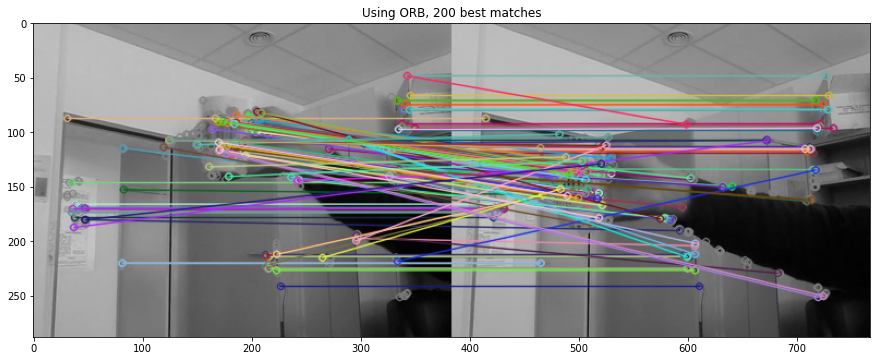

In [136]:
img3, Nbest1 = compare_images_cross(1, img1, img2)
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(img3)
ax.set_title('Using ORB, %i best matches'%Nbest1)

	 Detector: KAZE
	 Detection points and descriptors computation: 0.7722087 s
	 Matching Computation: 0.0009325 s


Text(0.5, 1.0, 'Using Kaze, 200 best matches')

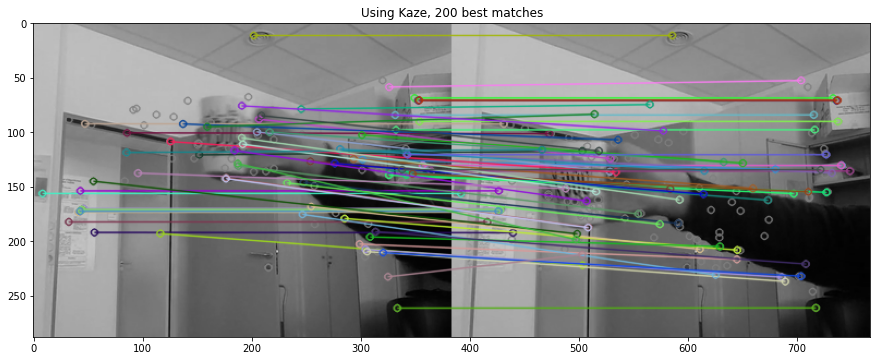

In [137]:
img4, Nbest2 = compare_images_cross(2, img1, img2)
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(img4)
ax.set_title('Using Kaze, %i best matches'%Nbest2)

##### FEATURES MATCH CROSS RATIO

In [138]:
def compare_images_ratio(detector,img1,img2):
    # fitting is happening in this function 
    img1,img2, pts1, pts2, desc1, desc2, gray1, gray2 = fit_detector(detector,img1,img2)
    # Beginning of matching
    t1 = cv2.getTickCount()
    if detector == 1:
      #Hamming distance for descriptor BRIEF (ORB)
      bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
    else:
      #L2 distance for descriptor M-SURF (KAZE)
      bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    # 2-nearest-neighbours list extraction
    matches = bf.knnMatch(desc1,desc2, k=2)
    # Application of the ratio test
    good = []  
    # introduce not good count to compare 
    not_good_count = 0 
    for m,n in matches:
      if m.distance < 0.7*n.distance:
        good.append([m])
      else: 
        not_good_count += 1 
    t2 = cv2.getTickCount()
    time = (t2 - t1)/ cv2.getTickFrequency()
    print("\t Matching Computation:",time,"s")

    # Displaying the matches that respect the ratio test
    draw_params = dict(matchColor = (0,255,0),
                       singlePointColor = (255,0,0),
                       flags = 0)
    img3 = cv2.drawMatchesKnn(gray1,pts1,gray2,pts2,good,None,**draw_params)
        

    Nb_ok = len(good)
    print("\t Good Ratio: {}".format(len(good)/ (len(good) + not_good_count)))
    print("\t Points to good matches: {}".format(2 * len(good)/ (len(pts1) + len(pts2))))
    return img3, Nb_ok

	 Detector: ORB
	 Detection points and descriptors computation: 0.0370283 s
	 Matching Computation: 0.0049217 s
	 Good Ratio: 0.14473684210526316
	 Points to good matches: 0.13110846245530394


Text(0.5, 1.0, 'Using ORB, 55 best matches')

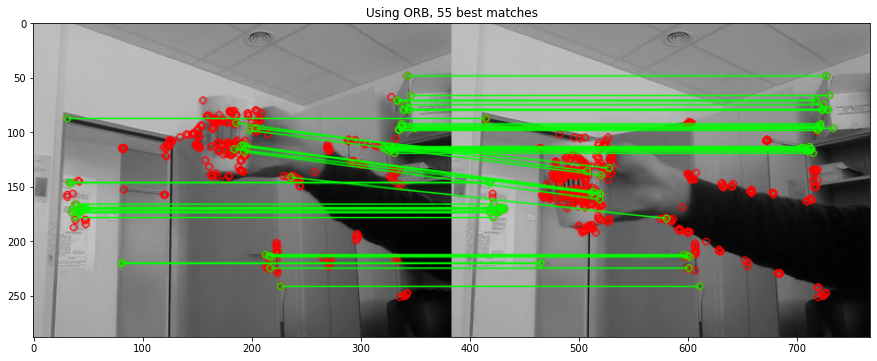

In [139]:
img5, Nb_ok = compare_images_ratio(1,img1,img2)
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(img5)
ax.set_title('Using ORB, %i best matches'%Nb_ok)

	 Detector: KAZE
	 Detection points and descriptors computation: 0.8309369 s
	 Matching Computation: 0.0008437 s
	 Good Ratio: 0.1951219512195122
	 Points to good matches: 0.17454545454545456


Text(0.5, 1.0, 'Using KAZE, 24 best matches')

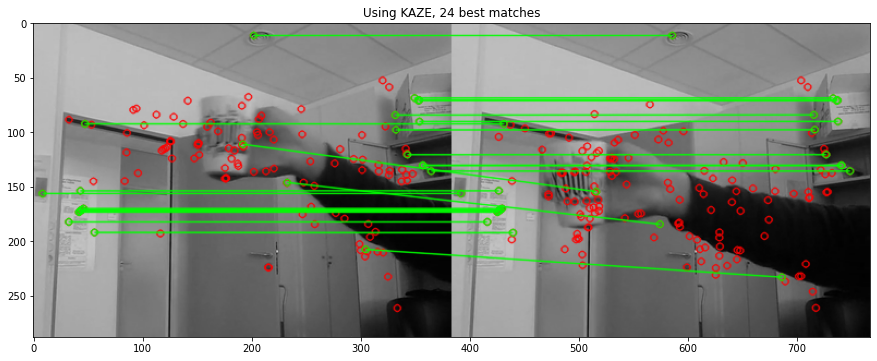

In [140]:
img6, Nb_ok = compare_images_ratio(2, img1, img2)
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(img6)
ax.set_title('Using KAZE, %i best matches'%Nb_ok)

#### FEATURES MATCH FLANN 

In [141]:
def compare_images_flann(detector,img1,img2):
    # fitting is happening in this function 
    img1,img2, pts1, pts2, desc1, desc2, gray1, gray2 = fit_detector(detector,img1,img2)
    # Beginning of matching
    t1 = cv2.getTickCount()
    # FLANN Parameters 
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks=50) 

    flann = cv2.FlannBasedMatcher(index_params,search_params)
    
    # THE FOLLOWING LINE GIVES AN ERROR 
    #matches = flann.knnMatch(desc1,desc2,k=2)
    
    # INSTEAD CONVERT TO F32
    matches= flann.knnMatch(np.asarray(desc1, np.float32),np.asarray(desc2,np.float32), 2) #2

    # Application of the ratio test
    good = []
    not_good_count = 0 
    for m,n in matches:
      if m.distance < 0.7*n.distance:
        good.append([m])
      else: 
        not_good_count += 1 
    t2 = cv2.getTickCount()
    time = (t2 - t1)/ cv2.getTickFrequency()
    print("\t Matching Computation:",time,"s")

    # Display
    draw_params = dict(matchColor = (0,255,0),
                       singlePointColor = (255,0,0),
                       flags = 0)

    # Displaying the matches that respect the ratio test
    img3 = cv2.drawMatchesKnn(gray1,pts1,gray2,pts2,good,None,**draw_params)

    Nb_ok = len(good)
    print("\t Good Ratio: {}".format(len(good)/ (len(good) + not_good_count)))
    print("\t Points to good matches: {}".format(2 * len(good)/ (len(pts1) + len(pts2))))
    return img3, Nb_ok

	 Detector: ORB
	 Detection points and descriptors computation: 0.0376592 s
	 Matching Computation: 0.0142389 s
	 Good Ratio: 0.10263157894736842
	 Points to good matches: 0.09296781883194279


Text(0.5, 1.0, 'Using ORB, 39 best matches')

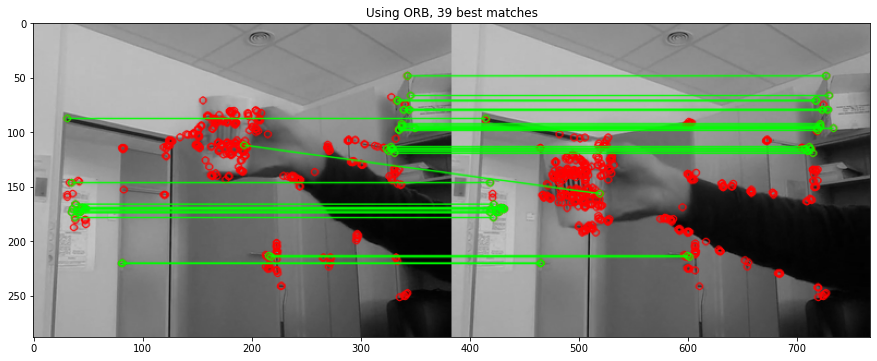

In [142]:
img7, Nb_ok = compare_images_flann(1, img1, img2)
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(img7)
ax.set_title('Using ORB, %i best matches'%Nb_ok)

	 Detector: ORB
	 Detection points and descriptors computation: 0.0365666 s
	 Matching Computation: 0.0157808 s
	 Good Ratio: 0.10263157894736842
	 Points to good matches: 0.09296781883194279


Text(0.5, 1.0, 'Using KAZE, 39 best matches')

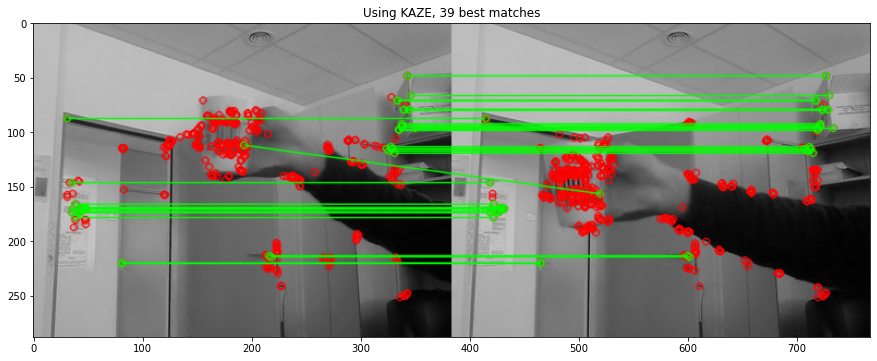

In [143]:
img8, Nb_ok = compare_images_flann(1, img1, img2)
fig, ax = plt.subplots(1, 1, figsize=(15, 8))
ax.imshow(img8)
ax.set_title('Using KAZE, %i best matches'%Nb_ok)

**Comments:**
> - All three scripts use Hamming distance for the BRIEF descriptor (ORB) or L2 Norm for the M-Surf Descriptor (KAZE) to match points. The respective distance measure is used to match each keypoint in the first image with a keypoint in the second image.

> - The script Features_Match_CrossCheck.py sorts the distance such that the feature points with descriptors that have a small difference are proposed as matches. It uses a BruteForce Matcher that calculates all distances between each descriptor pair. It sorts the descriptor pairs and matches two points, which feature descriptors have the smallest distance according to the distance metric.

> - The script Features_Match_RatioTest.py proposes a ratio test to filter the matches. The ratio test was proposed by Lowe (2004). It eliminates matches where the second best match is almost as good as the first. It therefore assures that the matches are sufficiently different. It also uses the BruteForce matcher, but uses the KNN algorithm with K = 2. As a result, for each keypoint it provides two possible matches. The ratio test is then used to eliminate matches that are too similar.

> - The script Features_Match_FLANN.py uses FLANN ("Fast Library for Approximate Nearest Neighbors") to find an approximate nearest neighbour. As a result it is supposed to be faster than the first two scripts. In our experiments we could not verfiy this and computation was slighty slower, although one reason might have been that we needed to add a type conversion - to np.float32 - to make the script work. A ratio test is run similar to the Features_Match_RatioTest.py script.

**Comments:**
> - **Explain why the used distances are different for the two descriptors.**
>> - _Hamming Distance is used for the BRIEF Descriptor. The Hamming Distance is a measure of difference comparing two binary vectors. It is account after applying an XOR operation to two vectors. The BRIEF Descriptor uses a binary feature vector which makes this measure appropriate._
>> - _L2 Norm is used for the M-Surf Descriptor in KAZE. The L2 Norm also referred to as euclidean distance is a line in n-dimensional space between two points. M-Surf is a floating point descriptor. Because M-Surf does not make use of binary feature vectors but instead relies on values obtained from gaussian smoothing, the euclidean distance is appropriate._


> - **Explain why the strategy FLANN (and, in a lesser extent the strategy RatioTest) does not work well with ORB points.**
>> - _There are several reasons why FLANN does not perform well. First and most importantly, the FlannBasedMatcher uses L2 Norm by default. This makes it an appropriate choice for floating point descriptors but not for binary descriptors, like BRIEF used by ORB. Second, FLANN only provides approximate matches which are then subject to the ratio test and might be subsequently filtered, as the L2 Norm is not an appropriate distance measure._
>> - _Regarding the RatioTest strategy not performing well, this might be because the binary feature vector gives more similar distances that are then filtered out by the ratio test. In the following we visualize the influence of different ratios._


> - **Would it be possible to evaluate quantitatively the different matching strategies? If yes, explain how.**

>> Yes. Possible quantitative evaluations include: 
>> - 1) Determining the average distance of the matched points(Hamming or Euclidean) 
>> - 2) The ratio of matches to detected points provided by:
$\frac{2 * \sum matches} { \sum points} $
>> - 3) Using the ratio of matches to good matches to distinguish between different descriptors ("Good Ratio")
>> - We already implemented the ratio of matches to detected points and the Good ratio

#### Experimenting with different ratios for CROSS and FLANN using ORB

In [144]:
def compare_orb_ratios(detector,img1,img2,ratio,strategy):
    #Beginning the calculus
    t1 = cv2.getTickCount()
    #Creation of objects "keypoints"
    if detector == 1:
      kp1 = cv2.ORB_create(nfeatures = 500,#By default : 500
                           scaleFactor = 1.2,#By default : 1.2
                           nlevels = 8)#By default : 8
      kp2 = cv2.ORB_create(nfeatures=500,
                            scaleFactor = 1.2,
                            nlevels = 8)
    else:
      kp1 = cv2.KAZE_create(upright = False,#By default : false
                        threshold = 0.001,#By default : 0.001
                    nOctaves = 4,#By default : 4
                    nOctaveLayers = 4,#By default : 4
                    diffusivity = 2)#By default : 2
      kp2 = cv2.KAZE_create(upright = False,
                    threshold = 0.001,
                    nOctaves = 4,
                    nOctaveLayers = 4,
                    diffusivity = 2)
        
    #Conversion to gray scale
    gray1 =  cv2.cvtColor(img1,cv2.COLOR_BGR2GRAY)
    gray2 =  cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)
    #Detection and description of keypoints
    pts1, desc1 = kp1.detectAndCompute(gray1,None)
    pts2, desc2 = kp2.detectAndCompute(gray2,None)
    #Un-matched points will appear in grey 
    img1 = cv2.drawKeypoints(gray1, pts1, None, color=(127,127,127), flags=0)
    img2 = cv2.drawKeypoints(gray2, pts2, None, color=(127,127,127), flags=0)
    t2 = cv2.getTickCount()
    time = (t2 - t1)/ cv2.getTickFrequency()

    if strategy == "RATIO": 
        # Beginning of matching
        t1 = cv2.getTickCount()
        if detector == 1:
          #Hamming distance for descriptor BRIEF (ORB)
          bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
        else:
          #L2 distance for descriptor M-SURF (KAZE)
          bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        # 2-nearest-neighbours list extraction
        matches = bf.knnMatch(desc1,desc2, k=2)
        # Application of the ratio test
        good = []  
        # introduce not good count to compare 
        not_good_count = 0 
        for m,n in matches:
          if m.distance < ratio*n.distance:
            good.append([m])
          else: 
            not_good_count += 1 
        t2 = cv2.getTickCount()
        time = (t2 - t1)/ cv2.getTickFrequency()

        # Displaying the matches that respect the ratio test
        draw_params = dict(matchColor = (0,255,0),
                           singlePointColor = (255,0,0),
                           flags = 0)
        img3 = cv2.drawMatchesKnn(gray1,pts1,gray2,pts2,good,None,**draw_params)
        
        return img3
    if strategy == "FLANN": 
        # Beginning of matching
        t1 = cv2.getTickCount()
        # FLANN Parameters 
        FLANN_INDEX_KDTREE = 0
        index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
        search_params = dict(checks=50) 

        flann = cv2.FlannBasedMatcher(index_params,search_params)

        # THE FOLLOWING LINE GIVES AN ERROR 
        #matches = flann.knnMatch(desc1,desc2,k=2)

        # INSTEAD CONVERT TO F32
        matches= flann.knnMatch(np.asarray(desc1, np.float32),np.asarray(desc2,np.float32), 2) #2

        # Application of the ratio test
        good = []
        not_good_count = 0 
        for m,n in matches:
          if m.distance < ratio*n.distance:
            good.append([m])

        t2 = cv2.getTickCount()
        time = (t2 - t1)/ cv2.getTickFrequency()

        # Display
        draw_params = dict(matchColor = (0,255,0),
                           singlePointColor = (255,0,0),
                           flags = 0)

        # Displaying the matches that respect the ratio test
        img3 = cv2.drawMatchesKnn(gray1,pts1,gray2,pts2,good,None,**draw_params)

        return img3

Text(0.5, 1.0, 'FLANN ORB: Ratio = 0.9')

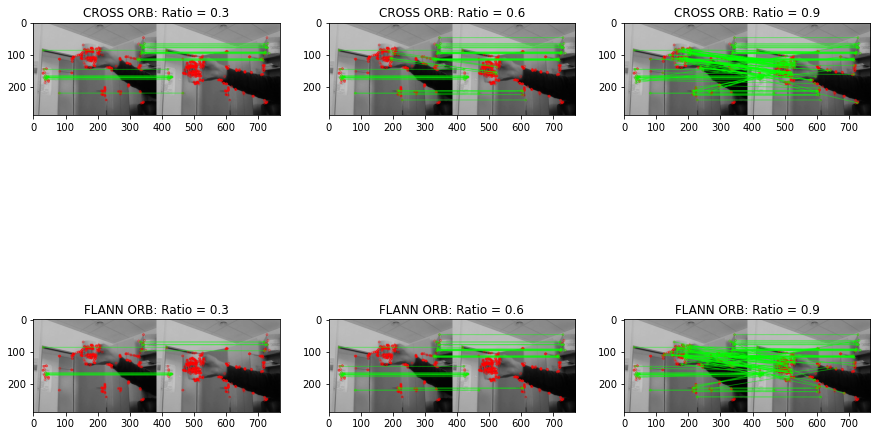

In [145]:
# try different ratios for CROSS and FLANN using ORB 
fig, ax = plt.subplots(2, 3, figsize=((15, 10)))
 
ax[0][0].imshow((compare_orb_ratios(1,img1,img2, 0.3,"RATIO")), cmap='gray')
ax[0][0].set_title('CROSS ORB: Ratio = 0.3')
    
ax[0][1].imshow((compare_orb_ratios(1,img1,img2, 0.6,"RATIO")), cmap='gray')
ax[0][1].set_title('CROSS ORB: Ratio = 0.6')
    
ax[0][2].imshow((compare_orb_ratios(1,img1,img2, 0.9,"RATIO")), cmap='gray')
ax[0][2].set_title('CROSS ORB: Ratio = 0.9')

ax[1][0].imshow(compare_orb_ratios(1,img1,img2, 0.3, "FLANN"), cmap='gray')
ax[1][0].set_title('FLANN ORB: Ratio = 0.3')

ax[1][1].imshow(compare_orb_ratios(1,img1,img2, 0.6, "FLANN"), cmap='gray')
ax[1][1].set_title('FLANN ORB: Ratio = 0.6')

ax[1][2].imshow(compare_orb_ratios(1,img1,img2, 0.9, "FLANN"), cmap='gray')
ax[1][2].set_title('FLANN ORB: Ratio = 0.9')

In the following we show that using the points to matches approach, KAZE outperforms ORB for every strategy.

In [146]:
cross, ratio, flann = [], [], []

# no ratio 
cross.append(compare_images_cross(1,img1,img2)[0])
cross.append(compare_images_cross(2,img1,img2)[0])
print("--------------------------------------")

# ratio 
ratio.append(compare_images_ratio(1,img1,img2)[0])
ratio.append(compare_images_ratio(2,img1,img2)[0])
print("--------------------------------------")

# flann 
flann.append(compare_images_flann(1,img1,img2)[0])
flann.append(compare_images_flann(2,img1,img2)[0])

	 Detector: ORB
	 Detection points and descriptors computation: 0.0440143 s
	 Matching Computation: 0.0085529 s
	 Detector: KAZE
	 Detection points and descriptors computation: 0.7927503 s
	 Matching Computation: 0.0009953 s
--------------------------------------
	 Detector: ORB
	 Detection points and descriptors computation: 0.0329736 s
	 Matching Computation: 0.0045856 s
	 Good Ratio: 0.14473684210526316
	 Points to good matches: 0.13110846245530394
	 Detector: KAZE
	 Detection points and descriptors computation: 0.8791269 s
	 Matching Computation: 0.0008555 s
	 Good Ratio: 0.1951219512195122
	 Points to good matches: 0.17454545454545456
--------------------------------------
	 Detector: ORB
	 Detection points and descriptors computation: 0.036645 s
	 Matching Computation: 0.0149738 s
	 Good Ratio: 0.10263157894736842
	 Points to good matches: 0.09296781883194279
	 Detector: KAZE
	 Detection points and descriptors computation: 0.8168904 s
	 Matching Computation: 0.0037303 s
	 Good Ra

Text(0.5, 1.0, 'FLANN KAZE')

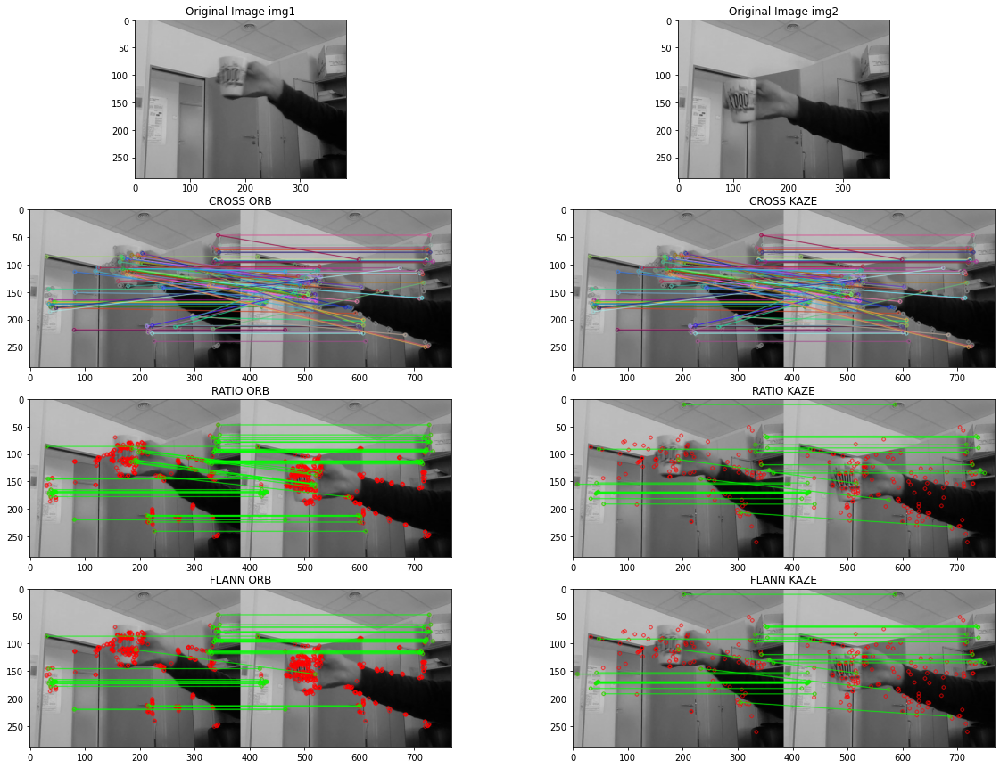

In [147]:
fig, ax = plt.subplots(4, 2, figsize=((20, 15)))

ax[0][0].imshow(img1, cmap='gray')
ax[0][0].set_title('Original Image img1')
    
ax[0][1].imshow(img2, cmap='gray')
ax[0][1].set_title('Original Image img2')

ax[1][0].imshow(cross[0], cmap='gray')
ax[1][0].set_title('CROSS ORB')
    
ax[1][1].imshow(cross[0], cmap='gray')
ax[1][1].set_title('CROSS KAZE')
    
ax[2][0].imshow(ratio[0], cmap='gray')
ax[2][0].set_title('RATIO ORB')
    
ax[2][1].imshow(ratio[1], cmap='gray')
ax[2][1].set_title('RATIO KAZE')

ax[3][0].imshow(flann[0], cmap='gray')
ax[3][0].set_title('FLANN ORB')
    
ax[3][1].imshow(flann[1], cmap='gray')
ax[3][1].set_title('FLANN KAZE')

#### Experimenting with other images:

In [148]:
img1 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Cat2Fly0.png')
print("\t Dimension of image 1:",img1.shape[0],"rows x", img1.shape[1],"columns")
print("\t Type of image 1:",img1.dtype)
img2 = cv2.imread('.\TP1_Image_Pairs\Image_Pairs\Cat2Fly1.png')
print("\t Dimension of image 2:",img2.shape[0],"rows x", img2.shape[1],"columns")
print("\t Type of image 2:",img1.dtype)

	 Dimension of image 1: 360 rows x 480 columns
	 Type of image 1: uint8
	 Dimension of image 2: 360 rows x 480 columns
	 Type of image 2: uint8


Text(0.5, 1.0, 'FLANN ORB: Ratio = 0.9')

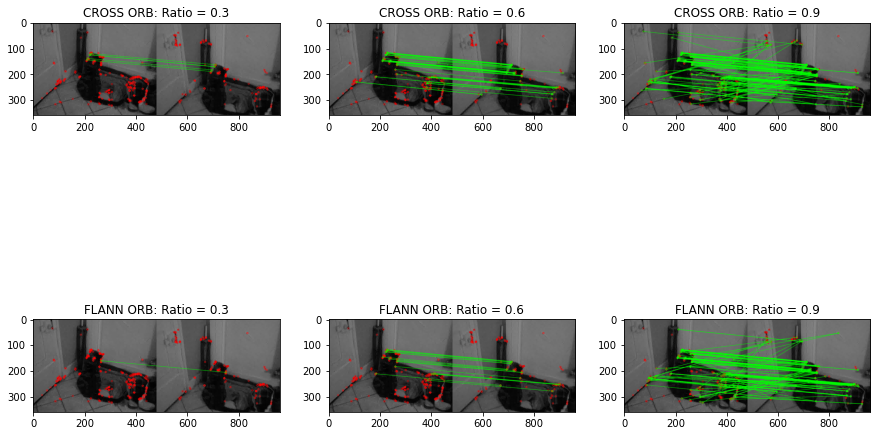

In [149]:
# try different ratios for CROSS and FLANN using ORB 
fig, ax = plt.subplots(2, 3, figsize=((15, 10)))
 
ax[0][0].imshow((compare_orb_ratios(1,img1,img2, 0.3,"RATIO")), cmap='gray')
ax[0][0].set_title('CROSS ORB: Ratio = 0.3')
    
ax[0][1].imshow((compare_orb_ratios(1,img1,img2, 0.6,"RATIO")), cmap='gray')
ax[0][1].set_title('CROSS ORB: Ratio = 0.6')
    
ax[0][2].imshow((compare_orb_ratios(1,img1,img2, 0.9,"RATIO")), cmap='gray')
ax[0][2].set_title('CROSS ORB: Ratio = 0.9')

ax[1][0].imshow(compare_orb_ratios(1,img1,img2, 0.3, "FLANN"), cmap='gray')
ax[1][0].set_title('FLANN ORB: Ratio = 0.3')

ax[1][1].imshow(compare_orb_ratios(1,img1,img2, 0.6, "FLANN"), cmap='gray')
ax[1][1].set_title('FLANN ORB: Ratio = 0.6')

ax[1][2].imshow(compare_orb_ratios(1,img1,img2, 0.9, "FLANN"), cmap='gray')
ax[1][2].set_title('FLANN ORB: Ratio = 0.9')

**Comments:**
> - The green lines represent matches between keypoints for the picture on the left with the keypoints of the picture on the right. Altering the ratio in the ratio test from 0.9 to 0.6 and 0.3, decreases the number of matches respectively. A lower ratio requires a higher dissimilarity of first and second best match.

**References:**
> - Alcantarilla, P. F., Bartoli, A., & Davison, A. J. (2012, October). KAZE features. In European Conference on Computer Vision (pp. 214-227). Springer, Berlin, Heidelberg.
> - Rublee, E., Rabaud, V., Konolige, K., & Bradski, G. (2011, November). ORB: An efficient alternative to SIFT or SURF. In 2011 International conference on computer vision (pp. 2564-2571). Ieee.
    